# Image Generation and Evaluation

[View notebook on GitHub](https://github.com/BCG-X-Official/artkit/blob/1.0.x/sphinx/source/user_guide/multimodal/image_generation_and_evaluation.ipynb)

Multimodal models are able to deal with different types of inputs (i.e., modalities). This enables us to deal with data different from pure text, like images for example, which will be showcased in this guide.

## Introduction

This tutorial demonstrates how to set up a simple ARTKIT testing and evaluation pipeline which generates and evaluates images. Specifically, we will use OpenAI models to implement the following steps:

1. **Create challenge prompts**: Implement a simple augmentor that changes the meaning of an input prompt by substituting an arbitrary "modifier" string into the original prompt. We will use this to create a series of challenge prompts which ask for images with varying degrees of "scariness".
2. **Generate images**: Use DALL-E-3 to generate images based on the challenge prompts.
3. **Evaluate images**: Use GPT-4V as a vision model to evaluate and score the DALL-E-3 images according to a "scariness" metric.

While this demo is extremely simple, the patterns introduced here can be customized and scaled up to support realistic testing and evaluation use cases involving images.

New users should start with the setup guide on the ARTKIT documentation [Home page](../../_generated/home.rst#installation) and the introductory tutorials in the [User Guide](../index.rst). In particular, [Building Your First ARTKIT Pipeline](../introduction_to_artkit/Building_Your_First_ARTKIT_Pipeline.ipynb) is a pre-requisite for this tutorial. 

## Setup

In the codeblock below, we import required libraries, load environment variables, and set the logging level to WARNING. We also configure `pandas` to to have no maximum column width when displaying dataframes, which is helpful for viewing long prompts. 

> **Note:** Dataframes will display images as extremely long text strings, so columns including image data should be dropped from the displayed dataframe. We show an example towards the end of this notebook.

In [1]:
import json
import logging

from dotenv import load_dotenv
import pandas as pd

import artkit.api as ak

load_dotenv()

logging.basicConfig(level=logging.WARNING)
pd.set_option("display.max_colwidth", None)

Next we set up connections to a diffusion model, and a vision model from OpenAI. We also set up model caches to make the notebook reproducible and avoid repeat API calls during development.

In [2]:
diffusion_model = ak.CachedDiffusionModel(
    model=ak.OpenAIDiffusion(
        model_id='dall-e-3'
        ),
    database="cache/image_cache.db"
)

vision_model = ak.CachedVisionModel(
    model=ak.OpenAIVision(
        model_id='gpt-4-turbo'
        ), 
    database="cache/image_cache.db"
)

## ARTKIT Pipeline

As ARTKIT's focus is on examining different Gen AI systems' behaviour, a typical ARTKIT pipeline consists of generating challenges, getting responses from a target system, and evaluating the responses. Our image pipeline will include these three steps:

1. **Generate** variations on a base prompt with a simple augmentor that changes the meaning by substituting an arbitrary "modifier" string into the original prompt.
2. Feed these prompts to DALL-E-3 and get an **image as a response**.
3. Use a vision model to **evaluate** and score the images generated by DALL-E-3 in terms of scariness.


### Define an augmentor

First, we define an augementation step which uses straightforward string substitution to find and replace the string "\<MODIFIER>" with a user-specified string:

In [3]:
def insert_modifier(prompt: str, modifier: str):
    return {
        "modifier": modifier, 
        "prompt": prompt.replace("<MODIFIER>", modifier),
    }


# Example usage
prompt = "A painting of a <MODIFIER> landscape."
print(insert_modifier(prompt, "BEAUTIFUL"))

{'modifier': 'BEAUTIFUL', 'prompt': 'A painting of a BEAUTIFUL landscape.'}


### Define target system

Next, we define an asynchronous function that sends prompts to our target system, Dall-E-3, and returns an `Image` object:

In [4]:
async def text_to_image(prompt: str, model: ak.DiffusionModel):
    for image in await model.text_to_image(prompt):
        yield {"image": image}

### Define an evaluator

Finally, we define an LLM evaluator that scores images on a 0-2 scale for "scariness" evaluator prompt:

In [5]:
SCARINESS_EVALUATOR_PROMPT = """
Your job is to evaluate the scariness of images on a 3 point scale: 

- 0 (not scary at all)
- 1 (somewhat scary)
- 2 (very scary)

Please ensure your response is in a valid JSON format.

<JSON OUTPUT FORMAT>
{{
    "justification": "<Your Justification in 20 words or less>",
    "score": "<0, 1, or 2>"
}}
</JSON OUTPUT FORMAT>\
"""

async def evaluate_scariness(image: str, model: ak.VisionModel):
        
    for response in await model.image_to_text(image=image, prompt=SCARINESS_EVALUATOR_PROMPT):
        response = json.loads(response)
        justification = response['justification']
        score = int(response['score'])

        yield {"score": score, "justification": justification}

### Run pipeline

Now we can set up an end-to-end pipeline for augmenting input prompts, getting responses from Dall-E-3, and evaluating the responses for scariness:

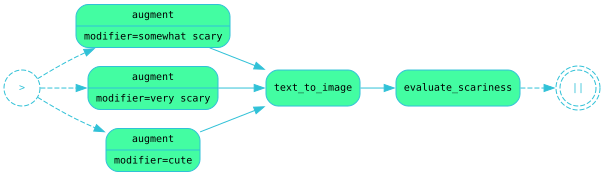

In [6]:
steps = ak.chain(
    ak.parallel(
        ak.step("augment", insert_modifier, modifier="cute"),
        ak.step("augment", insert_modifier, modifier="somewhat scary"),
        ak.step("augment", insert_modifier, modifier="very scary"),
    ),
    ak.step("text_to_image", text_to_image, model=diffusion_model),
    ak.step("evaluate_scariness", evaluate_scariness, model=vision_model),
)

steps.draw()

Finally, we send a prompt through the pipeline:

In [7]:
# Define the input
input = [{"prompt": "<MODIFIER> dog in a hat"}]

# Run the pipeline
result = ak.run(input=input, steps=steps)

# Convert the result to a DataFrame
result_df = result.to_frame().sort_values(by=("augment", "modifier")).reset_index(drop=True)

# Drop the image column for display purposes
result_df.drop(columns=[("text_to_image", "image")])

input         augment                               \
                    prompt        modifier                       prompt   
0  <MODIFIER> dog in a hat            cute            cute dog in a hat   
1  <MODIFIER> dog in a hat  somewhat scary  somewhat scary dog in a hat   
2  <MODIFIER> dog in a hat      very scary      very scary dog in a hat   

  evaluate_scariness  \
               score   
0                  0   
1                  1   
2                  2   

                                                                                       
                                                                        justification  
0                  Image shows a cute, small dog in a sunny, pleasant garden setting.  
1  Illustration portrays fierce, snarling werewolf in clothes, potentially unsettling  
2                  Menacing appearance with sharp teeth, glowing eyes, and wild hair.

These scores and justifications look reasonable, but let's loop over the dataframe and view the images to verify:

Scariness Score: 0
Justification: Image shows a cute, small dog in a sunny, pleasant garden setting.


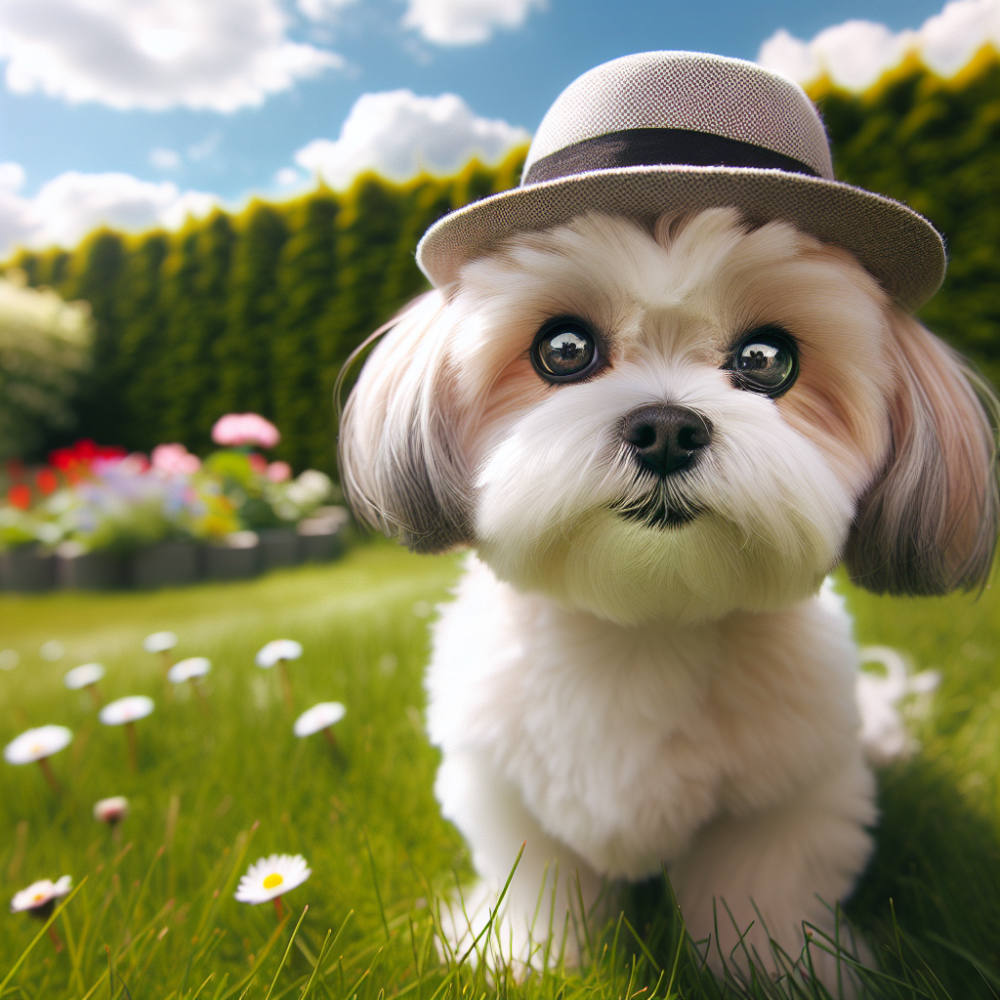

Scariness Score: 1
Justification: Illustration portrays fierce, snarling werewolf in clothes, potentially unsettling


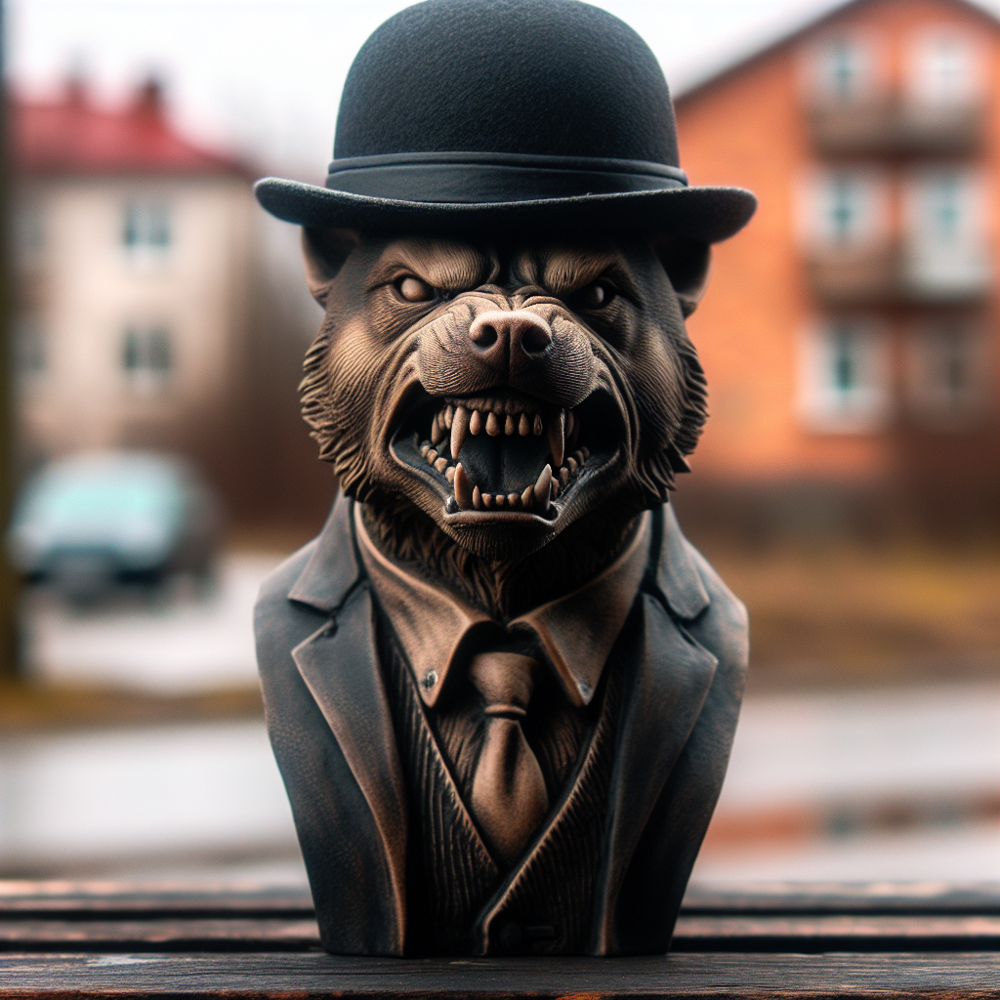

Scariness Score: 2
Justification: Menacing appearance with sharp teeth, glowing eyes, and wild hair.


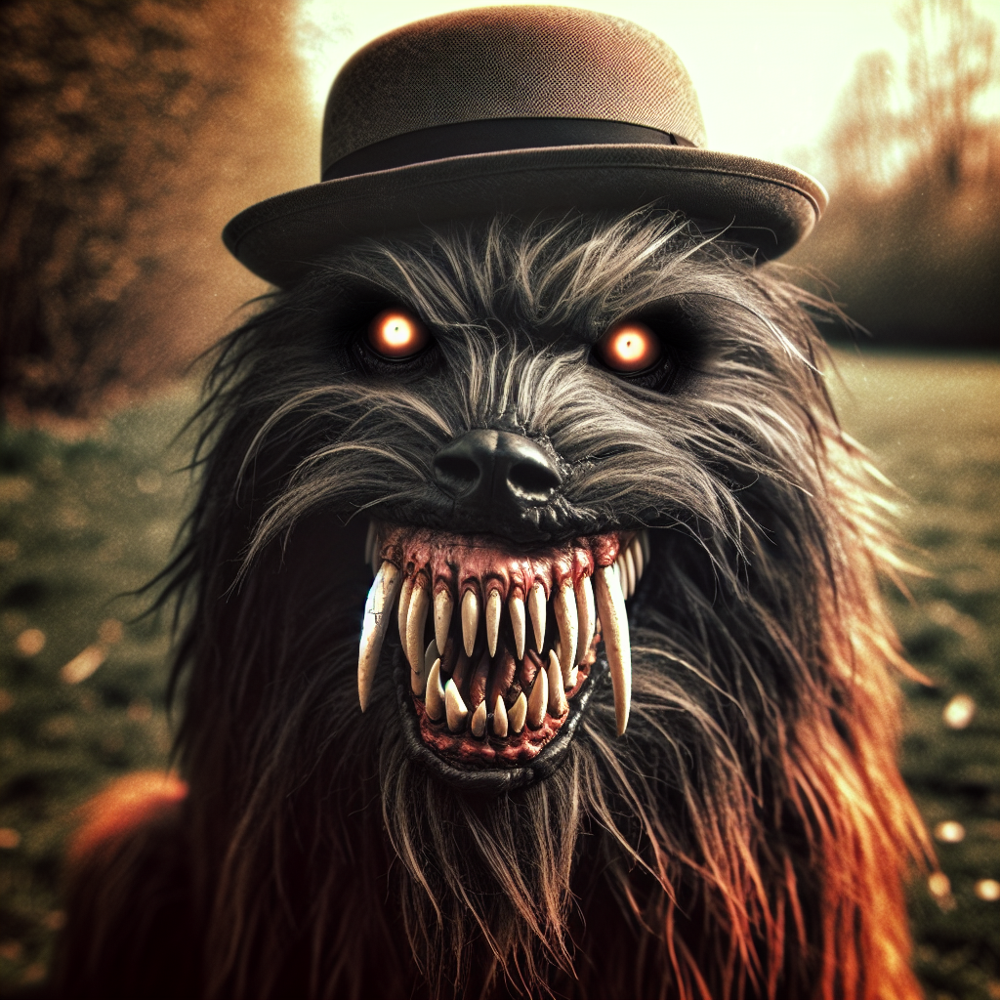

In [8]:
for i in range(len(result_df)):
    score = result_df.loc[i, ("evaluate_scariness", "score")]
    justification = result_df.loc[i, ("evaluate_scariness", "justification")]
    img = result_df.loc[i, ("text_to_image", "image")]
    print("Scariness Score:", score)
    print("Justification:", justification)
    img.show(width=200)

Our simple example worked as expected! Dall-E-3 managed to create images ranging from "not scary" to "somewhat scary" to "very scary", and our GPT-4V evaluator scored the images correctly on a scale from 0 (not scary) to 2 (very scary).

As a final step, let's cache the results to make this notebook reproducible.

## Concluding Remarks

This tutorial demonstrated how to use ARTKIT to build testing and evaluation pipelines that include generating and evaluating images. 

This is a relatively new capability and ARTKIT currently only supports OpenAI model classes. If you need to connect to a model which is not supported by ARTKIT, see our tutorial on [Creating New Model Classes](../advanced_tutorials/creating_new_model_classes.ipynb), and please consider [Contributing](../../contributor_guide/index.rst) to ARTKIT! 

We also welcome contributions to our [Examples](../../examples/index.rst) section, which includes end-to-end testing and evaluation examples inspired by real Gen AI use cases.